In [15]:
## %%# General
import warnings
warnings.filterwarnings ( "ignore" )
import os
#from time import time
from datetime import datetime,timedelta  #time,
import matplotlib.pyplot as plt
#import multiprocess as mp
#from IPython.display import display
#import multiprocess as mp
from pytictoc import TicToc

# Scientific and data
#import json
#import yaml
import numpy as np
from tqdm import tqdm
import pandas as pd
import  xarray as xr
from scipy.ndimage import gaussian_filter1d, gaussian_filter
#from scipy.interpolate import griddata
#from functools import partial
import seaborn as sns
eps = np.finfo(np.float).eps
import calendar
import matplotlib.dates as mdates

# pytorch
#import torch , torchvision
import torch.utils.data
#import torch.nn as nn
#from torch import functional as F
#from torch import Tensor
torch.manual_seed(8318)


# Local modules
import  learning_lidar.global_settings as gs
#import data_loader as dl
from learning_lidar.preprocessing import preprocessing as prep
#from utils import create_and_configer_logger
from learning_lidar.utils.miscLidar import calc_tau,generate_poisson_signal_STEP#, calc_extiction_klett, calc_gauss_curve,generate_poisson_signal

# %% Plotting settings
plt.rcParams['figure.dpi'] = 300
plt.rcParams['savefig.dpi'] = 300 # sns.set(rc={"figure.dpi":300, 'savefig.dpi':300}) # sns.set_context('notebook')
timeformat = mdates.DateFormatter('%H:%M')
wavelengts = [355,532,1064]
colors = ["darkblue", "darkgreen","darkred"]
# Set your custom color palette
sns.set_palette(sns.color_palette(colors))
customPalette = sns.set_palette(sns.color_palette(colors))

# %% For interactive figures in jupyter lab
#%matplotlib widget #%matplotlib inline
#plt.ion()
#import mpld3
#mpld3.enable_notebook()
# %%

## Load extended calibration database

In [16]:
main_folder=  r'C:\Users\addalin\Dropbox\Lidar\lidar_learning'

In [17]:
station_name = 'haifa'
station = gs.Station (station_name = station_name )
# print(station)
start_date = datetime ( 2017 , 9 , 1 )
end_date = datetime ( 2017 , 10 , 31 )
ds_path_extended = os.path.join(main_folder,'data',f"dataset_{station_name}_{start_date.strftime ( '%Y-%m-%d' )}_{end_date.strftime ( '%Y-%m-%d' )}_extended.nc")
csv_path_extended = os.path.join(main_folder,'data',f"dataset_{station_name}_{start_date.strftime ( '%Y-%m-%d' )}_{end_date.strftime ( '%Y-%m-%d' )}_extended.csv")
df = pd.read_csv ( csv_path_extended )
ds_extended = prep.load_dataset ( ds_path_extended)
wavelengths = [355,532,1064]
#display(ds_extended)

#### Choose a day

In [18]:
df_times = ds_extended.Time.to_pandas()
time_00 = datetime.today().time().min
days = [datetime.combine(day,time_00) for day in sorted(df_times.groupby(df_times.dt.date).groups.keys())]
day_number =2
day = days[day_number]
day_str = day.strftime('%Y-%m-%d')
# %%
cur_day = datetime.strptime(day_str,'%Y-%m-%d')
min_t = datetime.combine(cur_day.date(), cur_day.time().min)
max_t = cur_day + timedelta(hours = 24) - timedelta(seconds = 30)
t_slice = slice(min_t,cur_day.date()+timedelta(days=1))
arr_day = []
time_indx = pd.date_range(start = min_t, end = max_t,freq = '30S')
# %%

#### Create calibration daily dataset

In [19]:
# %%
for wavelength in [355,532,1064]:
	ds_i = ds_extended.sel(Wavelength = wavelength,Time= t_slice)#.copy(deep = True)
	ds_i = ds_i.resample(Time='30S').interpolate('nearest')
	ds_i = ds_i.reindex({"Time" : time_indx}, method="nearest",fill_value =  0)
	arr_day.append(ds_i)
ds_day = xr.concat(arr_day,dim = 'Wavelength')
# %%

#### 1. Lidar reference heights of the day - as calibrated by TROPOS

In [20]:
# %%
DISP_FIG = False
if DISP_FIG:
	fig, ax = plt.subplots(nrows=1, ncols=1)
	ds_day.LC.plot(x='Time',hue='Wavelength',ax=ax)
	ax.set_title(fr"{ds_day.LC.long_name} for {day_str}")
	plt.tight_layout()
	plt.show()
# %%

In [21]:
DISP_FIG = False
if DISP_FIG:
	fig, ax = plt.subplots(nrows=1, ncols=1)
	for r in ['r0','r1','rm']:
		ds_day[r].sel(Wavelength=355).plot(label=ds_day[r].long_name,ax=ax)
	ax.set_title(fr'Reference Range - {day_str}')
	ax.set_ylabel(r'$\rm Height[km]$')
	plt.legend()
	plt.tight_layout()
	plt.show()

## Load generated aerosol profiles

In [22]:
generation_folder =r'D:\data_haifa\GENERATION'
month_folder = start_date.strftime ( "%m" )
aer_folder = os.path.join(generation_folder,'aerosol_dataset',month_folder)
nc_aer = '2017_09_03_Haifa_aerosol.nc'
ds_aer = prep.load_dataset(os.path.join(aer_folder,nc_aer))
# ds_aer
sigma_aer = ds_aer.sigma# xr.apply_ufunc(lambda x: x + 1E+3*eps*np.random.rand(3000,2880),ds_aer.sigma, keep_attrs = True)
beta_aer = ds_aer.beta #xr.apply_ufunc(lambda x: x + 1E+1*eps*np.random.rand(3000,2880),ds_aer.beta, keep_attrs = True)

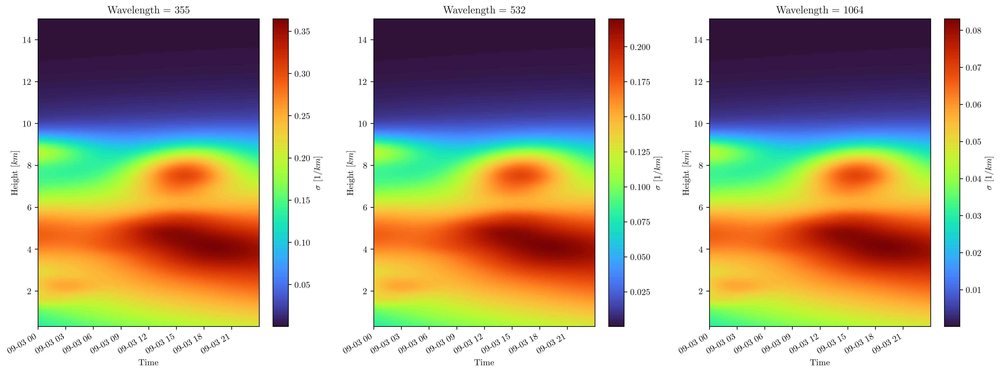

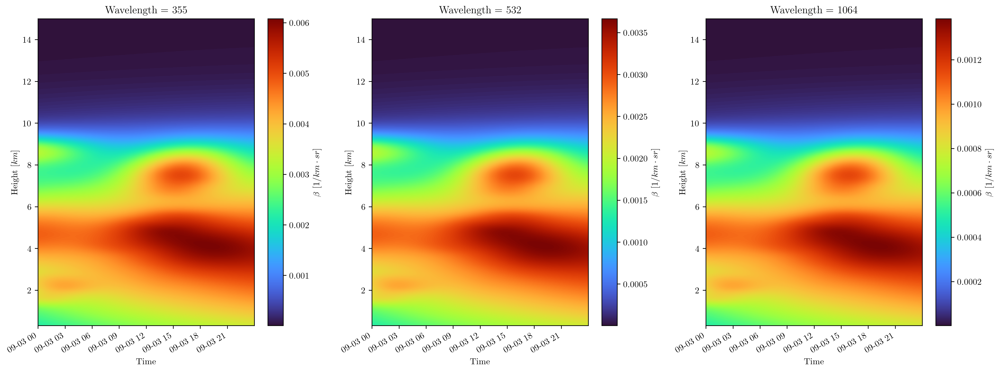

In [23]:
DISP_FIG = True
if DISP_FIG:
	height_slice=slice(0.0,15)
	fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(16,6))
	for wavelength,ax in zip(wavelengths,axes.ravel()):
		sigma_aer.sel(Height=height_slice, Wavelength = wavelength).plot(cmap='turbo',ax=ax)
	plt.tight_layout()
	plt.show()

	fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(16,6))
	for wavelength,ax in zip(wavelengths,axes.ravel()):
		beta_aer.sel(Height=height_slice, Wavelength = wavelength).plot(cmap='turbo',ax=ax)
	plt.tight_layout()
	plt.show()

## Load molecular profiles

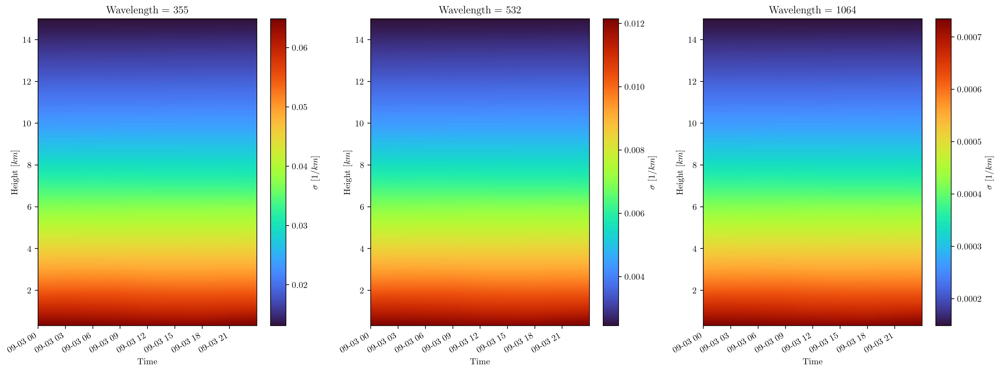

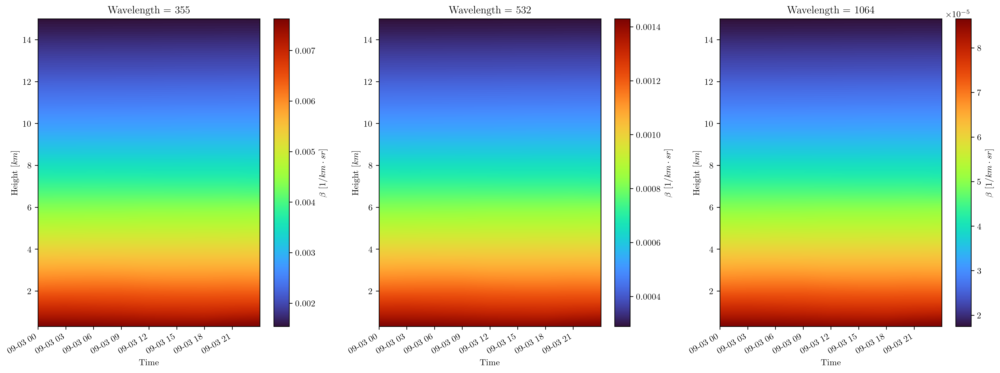

In [24]:
nc_name = r'2017_09_03_Haifa_molecular.nc'
folder_name = r'D:\data_haifa\DATA FROM TROPOS\molecular_dataset\2017\09'
ds_mol = prep.load_dataset(os.path.join(folder_name,nc_name))

if DISP_FIG:
	fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(16,6))
	for wavelength,ax in zip(wavelengths,axes.ravel()):
		ds_mol.sigma.sel(Height=height_slice, Wavelength = wavelength).plot(cmap='turbo',ax=ax)
	plt.tight_layout()
	plt.show()

	fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(16,6))
	for wavelength,ax in zip(wavelengths,axes.ravel()):
		ds_mol.beta.sel(Height=height_slice, Wavelength = wavelength).plot(cmap='turbo',ax=ax)
	plt.tight_layout()
	plt.show()

## Summing aerosol and molecular profiles
### $\beta = \beta_{aer}+\beta_{mol}$
### $\sigma = \sigma_{aer}+\sigma_{mol}$
### The molecular profiles were calculated from radiosondes measurements from NOA
> TODO: Blend or "fade" the aerosol layer before adding to molecular density

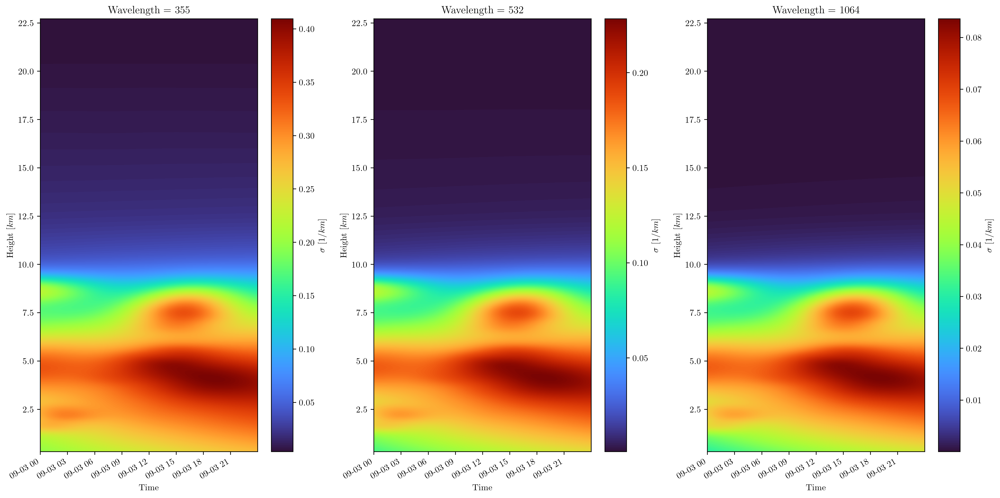

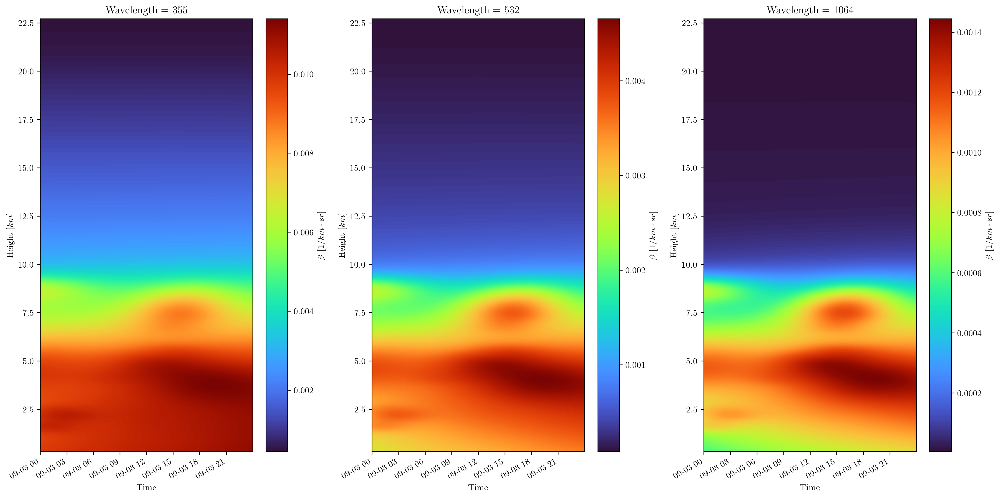

In [25]:
ds_total = xr.zeros_like(ds_mol)
ds_total= ds_total.assign(date= ds_mol.date)
ds_total.attrs = {'info': 'Daily generated profiles',
                'sources_file': 'generate_density.ipynb',
                'location': station.name}
ds_aer.lambda_nm.loc[:]=[355,532,1064]

ds_total.sigma.loc[:] = ds_mol.sigma + sigma_aer
ds_total.beta.loc[:] = ds_mol.beta + beta_aer
if DISP_FIG:
	fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(16,8))
	for wavelength,ax in zip(wavelengths,axes.ravel()):
		ds_total.sigma.sel(Wavelength = wavelength).plot(cmap='turbo',ax=ax)
	plt.tight_layout()
	plt.show()

	fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(16,8))
	for wavelength,ax in zip(wavelengths,axes.ravel()):
		ds_total.beta.sel(Wavelength = wavelength).plot(cmap='turbo',ax=ax)
	plt.tight_layout()
	plt.show()

## Calculating the attenuated backscatter $\beta_{\rm attbsc} = \beta\exp(-2\tau)$

In [26]:
alt_km = station.altitude*1e-3
heights = ds_total.Height.values - alt_km
dr = heights[1]-heights[0]

exp_tau_c =[]
for wavelength in wavelengths:
	exp_tau_t =[]
	for t in tqdm(ds_total.Time):
		sigma_t = ds_total.sigma.sel(Time= t)
		e_tau = xr.apply_ufunc(lambda x: np.exp(-2*calc_tau(x,heights)),
		                       sigma_t.sel(Wavelength= wavelength),keep_attrs = True)
		e_tau.name = r'$\exp(-2 \tau)$'
		exp_tau_t.append(e_tau)

	exp_tau_c.append(xr.concat(exp_tau_t,dim = 'Time'))
exp_tau_d = xr.concat(exp_tau_c,dim = 'Wavelength')
exp_tau_d = exp_tau_d.transpose('Wavelength','Height','Time' )
ds_total.attbsc.loc[:] = exp_tau_d.loc[:]*ds_total.beta

for profile in ['beta','sigma','attbsc']:
    ds_total[profile].attrs['info'] = ds_total[profile].attrs['info'].replace('Molecular','Total')


100%|██████████| 2880/2880 [00:04<00:00, 713.00it/s]


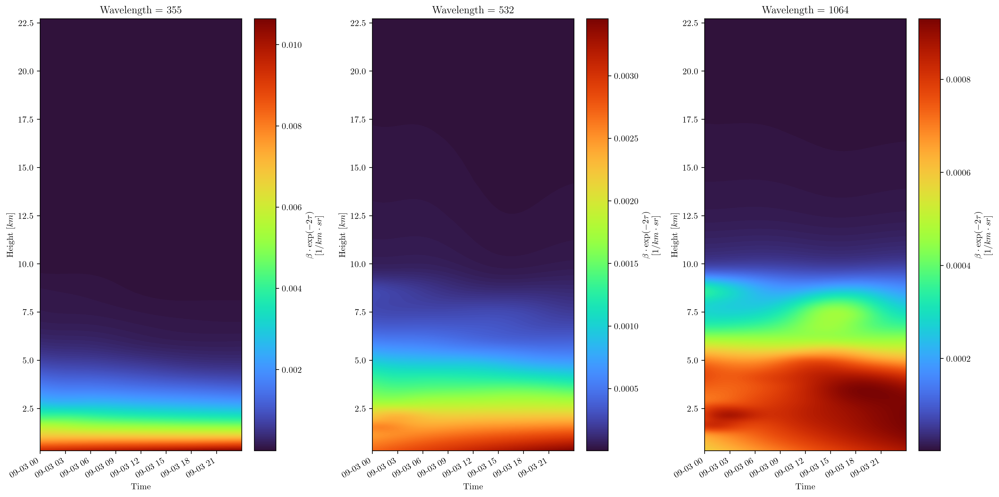

In [27]:
if DISP_FIG:
	fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(16,8))
	for wavelength,ax in zip(wavelengths,axes.ravel()):
		ds_total.attbsc.sel(Wavelength = wavelength).plot(cmap='turbo',ax=ax)
	plt.tight_layout()
	plt.show()

## Daily lidar constant

#### 1. Lidar power's factor of the day - as calibrated by TROPOS retrievals

In [28]:
ds_smooth = ds_day.apply(func = gaussian_filter1d,sigma=80,keep_attrs =True)
DISP_FIG = False
if DISP_FIG:
	fig, ax = plt.subplots(nrows=1, ncols=1)
	ds_day.LC.plot(x='Time',hue='Wavelength',ax=ax,linewidth=0.8,linestyle='--')
	ds_smooth.LC.plot(x='Time',hue='Wavelength',ax=ax,linewidth=0.8,linestyle='-.')
	ds_extended.sel(Time=slice(cur_day,cur_day+timedelta(hours = 24))).LC.plot(hue='Wavelength',linewidth=0.8)
	ds_extended.sel(Time=slice(cur_day,cur_day+timedelta(hours = 24))).\
		plot.scatter(y='LC',x='Time', hue='Wavelength',s=30,hue_style ='discrete',edgecolor='w')

	ax.set_title(fr"{ds_day.LC.long_name} for {day_str}")
	plt.tight_layout()
	plt.show()

#### 2. Lidar power's factor of the day - generated

In [29]:
nc_power = f"generated_LC_{station.name}_{start_date.strftime('%Y-%m-%d')}_{end_date.strftime('%Y-%m-%d')}.nc"
ds_gen_p = prep.load_dataset(os.path.join(generation_folder,nc_power))
tday = slice(cur_day,cur_day+timedelta(hours = 24)-timedelta(seconds = 30))
p_day_gen = ds_gen_p.p.sel(Time=tday)

DISP_FIG = False
if DISP_FIG:
	p_day_gen.plot(hue='Wavelength',linewidth=0.8)
	#ds_gen_p.sel(Time=tday).plot.scatter(y='p_new',x='Time',hue='Wavelength',s=15,hue_style ='discrete',edgecolor='w')
	plt.title(fr"B\'ezier interpolation of {ds_gen_p.p.long_name} - for {cur_day.strftime('%d/%m/%Y' )}")
	plt.tight_layout()
	plt.show()

#### 3. Calculating range corrected signal $p\cdot r^2 =LC_{generated}\cdot\beta\exp(-2\tau)$
- Calculate a new Lidar signal $p$,based on LC generated p_day_gen.
$p\cdot r^2 = {LC_{\rm generated}}\cdot\beta\exp(-2\tau) = {LC_{\rm generated}}\cdot\beta_{\rm attbsc}$
> see  generation process at: C:\Users\addalin\Dropbox\Lidar\code\generate_LC_pattern.ipynb

In [30]:
pr2_c =[]
for wavelength in wavelengths:
    pr2_t =[]
    p_t=[]
    for t in tqdm(ds_total.Time,desc = f'Time loop for {wavelength}'):
        attbsc_t = ds_total.attbsc.sel(Time= t)
        LC_t = p_day_gen.sel(Time = t) #   ds_smooth.LC.sel(Time = t)
        pr2 = xr.apply_ufunc(lambda x,y:(x*y)  ,
                            attbsc_t.sel(Wavelength= wavelength),
                            LC_t.sel(Wavelength= wavelength),keep_attrs = True)
        pr2.name = r'$pr2$'
        pr2_t.append(pr2)
        
    pr2_c.append(xr.concat(pr2_t,dim = 'Time'))
    
pr2_d = xr.concat(pr2_c,dim = 'Wavelength')
pr2_d = pr2_d.transpose('Wavelength','Height','Time' )
pr2_d.attrs['info']='Lidar Range Corrected Signal'
pr2_d.attrs['long_name']=r'$p$'+r'$\cdot r^2$'
pr2_d.attrs['units']=r'$\rm$'+r'$photons$'+r'$\cdot km^2$'



Time loop for 1064: 100%|██████████| 2880/2880 [00:08<00:00, 343.64it/s]


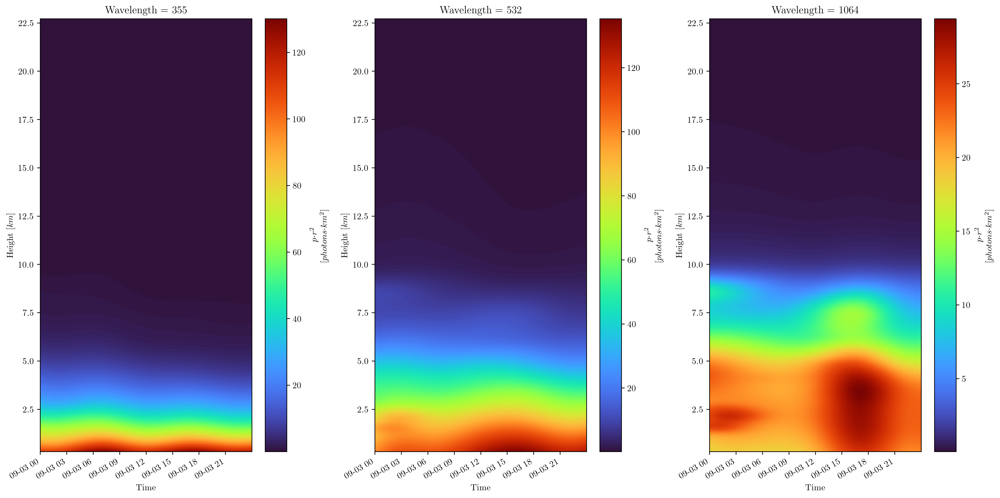

In [31]:
DISP_FIG = True
if DISP_FIG:
	fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(16,8))
	for wavelength,ax in zip(wavelengths,axes.ravel()):
		pr2_d.sel(Wavelength = wavelength).plot(cmap='turbo',ax=ax)
	plt.tight_layout()
	plt.show()

#### 4. Calculating lidar signal $p = \frac{LC_{generated}\cdot \beta_{\rm attbsc}}{r^2}$

In [32]:
rr_im = np.tile(heights.reshape(pr2_d.Height.size,1),(pr2_d.Wavelength.size,1,pr2_d.Time.size))**2

ds_total = ds_total.assign(rr= xr.Variable(dims=('Wavelength','Height','Time'),data = rr_im))
p_d= (pr2_d/ds_total.rr).astype(int)
p_d.attrs['info']='Lidar Signal'
p_d.attrs['long_name']=r'$p$'
p_d.attrs['units']=r'$photons$'
p_d.name=r'$p$'

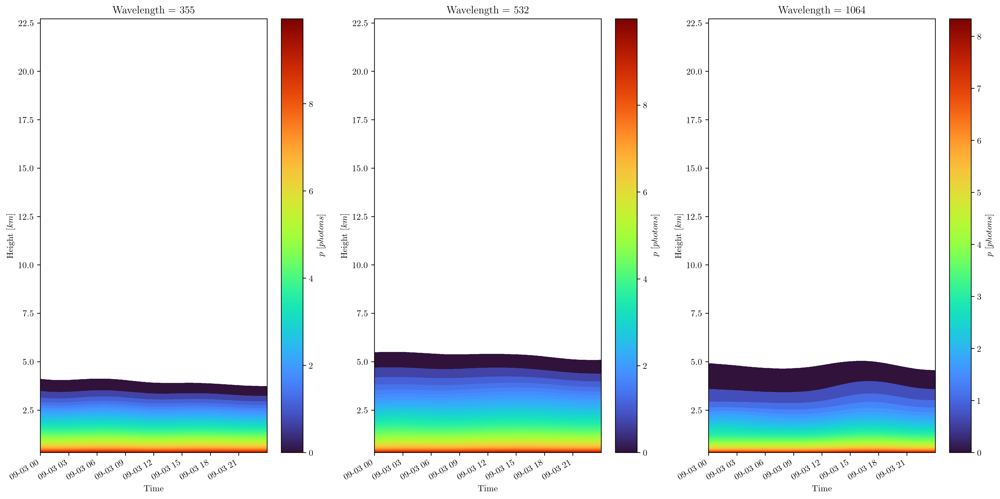

In [33]:
if DISP_FIG:
	fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(16,8))
	for wavelength,ax in zip(wavelengths,axes.ravel()):
		log_p = xr.apply_ufunc(lambda p:np.log(p),p_d.sel(Wavelength = wavelength),keep_attrs = True)
		log_p.plot(cmap='turbo',ax=ax)
		#p_d.sel(Wavelength = wavelength).plot(cmap='turbo',ax=ax)
	plt.tight_layout()
	plt.show()

## Daily background
- Created daily mean background signal in: generate_bg_signals.ipynb

#### 1. Load bg mean signal per month

In [34]:
month = cur_day.month
year = cur_day.year
last = (calendar.monthrange(year,month)[1])
start_dt = datetime(year,month,1)
end_dt = datetime(year,month,last)

start_dt, end_dt
nc_name = f"generated_bg_{station.name}_{start_dt.strftime('%Y-%m-%d')}_{end_dt.strftime('%Y-%m-%d')}.nc"
bg_folder= r'D:\data_haifa\GENERATION\bg_dataset'
ds_bg =  prep.load_dataset(ncpath =os.path.join( bg_folder, nc_name))

#### 2. Slice the relevant day of the monthly signal

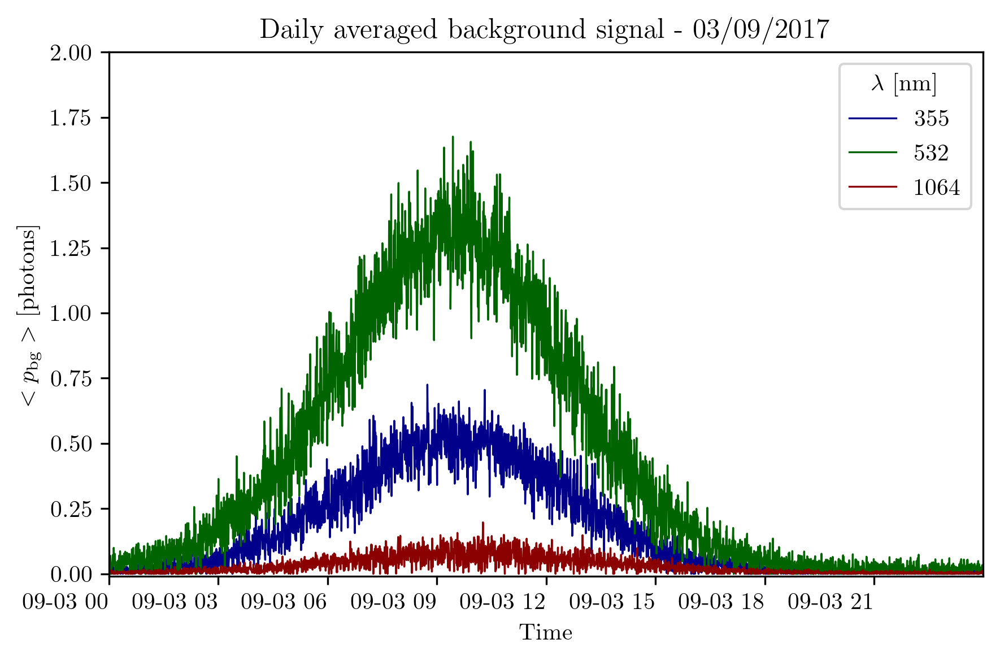

In [35]:
dslice = slice(cur_day,cur_day+timedelta(days = 1)-timedelta(seconds = 30))
ds_total = ds_total.assign( bgmean = ds_bg.sel(Time = dslice).bg)
if DISP_FIG:
	fig, ax = plt.subplots(ncols=1,nrows=1)
	ds_total.bgmean.sel(Time = dslice).plot(hue='Wavelength', ax=ax,linewidth=0.8)
	ax.set_xlim([dslice.start,dslice.stop])
	ax.set_title(f"{ds_bg.bg.info} - {cur_day.strftime('%d/%m/%Y')}")
	plt.xticks(rotation=0)
	ax.set_ybound([-.01,2])
	plt.tight_layout()
	plt.show()

#### 4. Calculate $P_{measure}$
- Calculate a new signal $p_{new} \sim Poiss (\mu_{p} ) $, $s.t.\;\mu_{p} =\mathbb{E}(p) + <p_{bg}>$

 - Calculate $\mu_{p}$

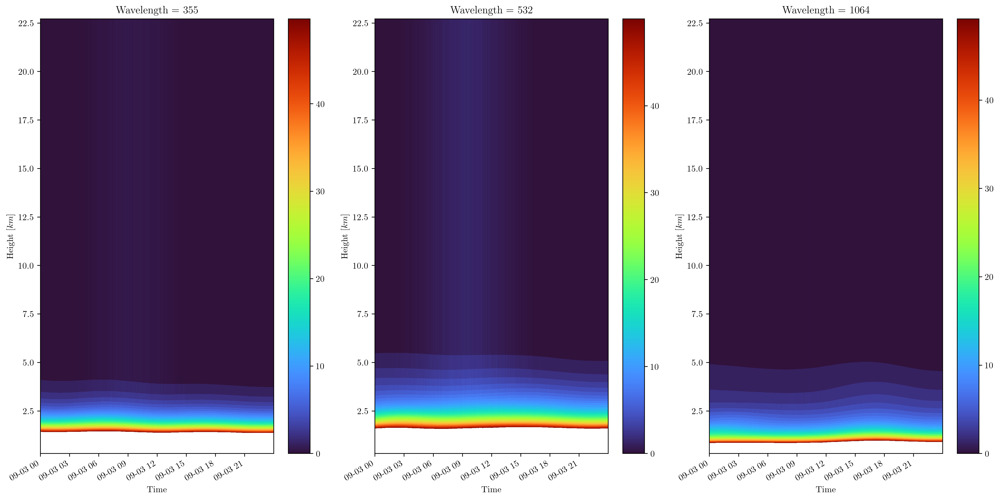

In [36]:
p_mean = p_d + ds_total.bgmean
if DISP_FIG:
	fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(16,8))
	for wavelength,ax in zip(wavelengths,axes.ravel()):
		p_mean.where(p_mean<50).sel(Wavelength = wavelength).plot(cmap='turbo',ax=ax)
	plt.tight_layout()
	plt.show()

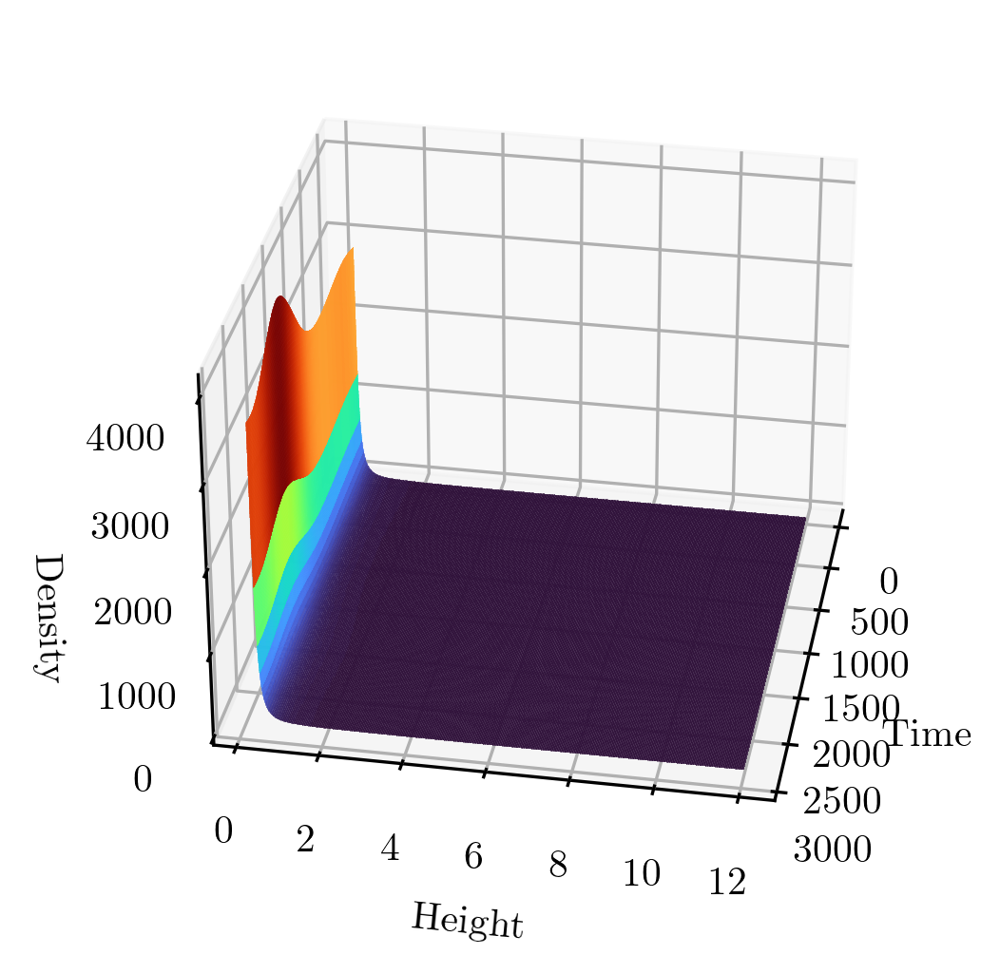

In [37]:
X = np.arange(0, 2880, 1)
th = 12.0
Y = pr2_d.Height.sel(Height=slice(0,th)).values
X, Y = np.meshgrid(X, Y)
#Z = pr2_d.sel(Wavelength = wavelength,Height=slice(0,th)).values
Z = p_d.sel(Wavelength = wavelength,Height=slice(0,th)).values
ax = plt.axes(projection='3d')
surf = ax.plot_surface(X, Y, Z, cmap = 'turbo',
                       linewidth=0.1,rstride=5,alpha=.5,
                       cstride=5, antialiased=False)
ax.set_ylabel('Height')
ax.set_xlabel('Time')
ax.set_zlabel('Density')
#ax.set_ylim([0,5.0])
fig.colorbar(surf, shrink=0.8, aspect=5)
ax.view_init(30, 10)
plt.show()

 - Calculate $Poiss (\mu_{p})$, for $\mu_{p}>50$ : $\mu_{p} + \sqrt{\mu_{p}}\cdot  \mathcal{N}(0,1)$

In [38]:
tic0 = TicToc()
tic0.tic()
pn_h = xr.apply_ufunc(lambda mu: (mu + (np.sqrt(mu))*np.random.normal(loc=0, scale=1.0,size=mu.shape)).astype(int),
                       p_mean.where(p_mean>=50).fillna(0),keep_attrs =True)
pn_l = xr.apply_ufunc(lambda mu:generate_poisson_signal_STEP(mu),
                         p_mean.where(p_mean<50).fillna(0),keep_attrs =True,dask = 'parallelized')
tic0.toc()
pn_ds = pn_h+pn_l
pn_ds.attrs['info']='Poisson Lidar Signal'
pn_ds.attrs['long_name']=r'$p$'
pn_ds.attrs['units']=r'$\rm$'+r'$photons$'

poisson STEP: 100%|██████████| 25920000/25920000 [02:03<00:00, 210368.23it/s]


Elapsed time is 124.538045 seconds.


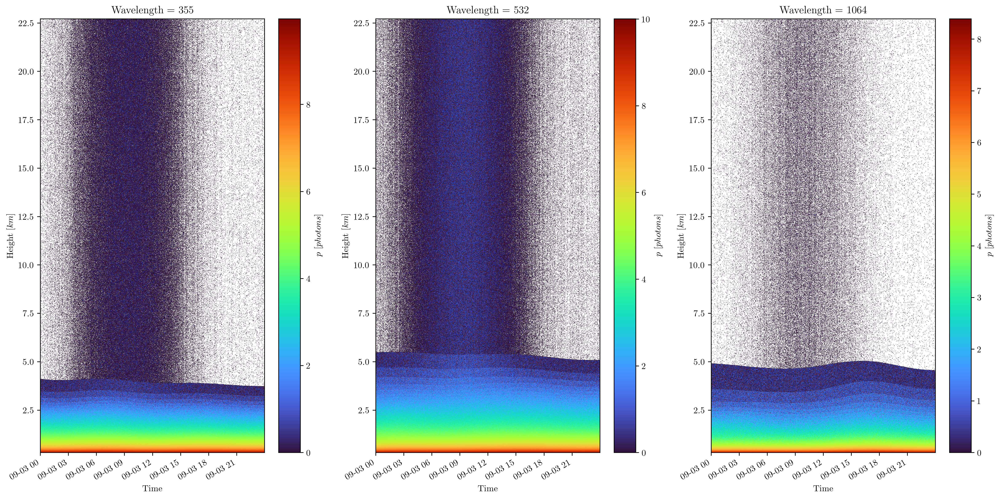

In [39]:
if DISP_FIG:
	fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(16,8))
	for wavelength,ax in zip(wavelengths,axes.ravel()):
		log_p = xr.apply_ufunc(lambda p:np.log(p) ,pn_ds.sel(Wavelength = wavelength),keep_attrs = True)
		log_p.plot(cmap='turbo',ax=ax)
		#pn_ds.sel(Wavelength = wavelength).plot(cmap='turbo',ax=ax)
	plt.tight_layout()
	plt.show()

- Calculate range corrected signal $p_{new}\cdot r^2$

In [40]:
pr2n_d= (pn_ds*ds_total.rr).astype(int)
pr2n_d.attrs['info']='Lidar Range Corrected Signal - noisy'
pr2n_d.attrs['long_name']=r'$p$'+r'$\cdot r^2$'
pr2n_d.attrs['units']=r'$\rm$'+r'$photons$'+r'$\cdot km^2$'
DISP_FIG = False
if DISP_FIG:
	fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(16,8))
	for wavelength,ax in zip(wavelengths,axes.ravel()):
		log_p = xr.apply_ufunc(lambda p:np.log(p),pr2n_d.sel(Wavelength = wavelength),keep_attrs = True)
		log_p.plot(cmap='turbo',ax=ax)
		#pr2n_d.where(pr2n_d>=0.0).sel(Wavelength = wavelength).plot(cmap='turbo',ax=ax)
	plt.tight_layout()
	plt.show()


In [41]:
DISP_FIG = False
if DISP_FIG:
	fig, axes = plt.subplots(nrows=3, ncols=1, figsize=(8,16))
	for ax,wavelength in zip(axes.ravel(),wavelengths):
		log_p = xr.apply_ufunc(lambda p:np.log(p),pr2n_d.sel(Wavelength = wavelength),keep_attrs = True)
		log_p.plot(cmap='turbo',ax=ax)
		#pr2n_d.sel(Wavelength = wavelength).plot(cmap='turbo', ax=ax)
		ax.xaxis.set_major_formatter(timeformat)
	plt.tight_layout()
	plt.show()
#pr2_d

#### Exploring 1D profiles of:
- $p$
- $p\cdot r^2$
- $p_{\rm Poiss}$
- $p_{\rm Poiss}\cdot r^2$

NameError: name 'up_pd' is not defined

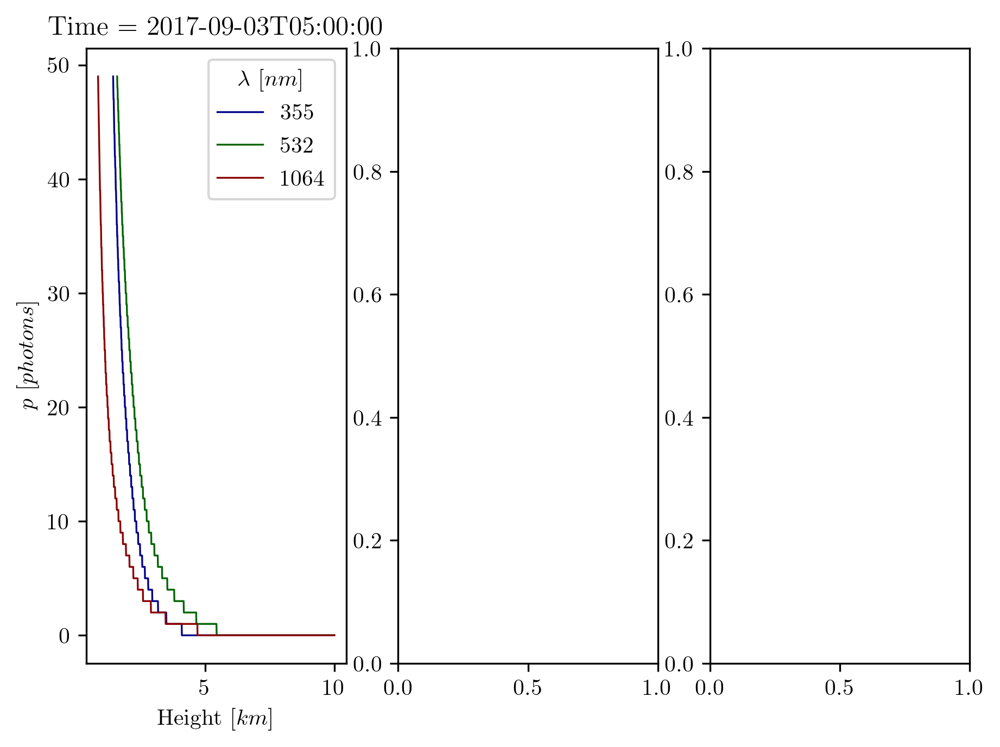

In [42]:
DISP_FIG = True
if DISP_FIG:
	Times = cur_day+np.array([timedelta(hours = 5),timedelta(hours = 10),timedelta(hours = 15)])
	fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(7,5))
	for t,ax in zip(Times,axes.ravel()):
		p_d.where(p_d<50).sel(Time = t,Height=slice(0,10)).plot(ax=ax,hue='Wavelength',linewidth=0.8)
		up_pd.where(up_pd<50).sel(Time = t,Height=slice(0,10)).plot(ax=ax,hue='Wavelength',linewidth=0.8,linestyle='--')

	plt.tight_layout()
	plt.show()

	Times = cur_day+np.array([timedelta(hours = 5),timedelta(hours = 10),timedelta(hours = 15)])
	fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(7,5))
	for t,ax in zip(Times,axes.ravel()):
		pr2_d.where(p_mean<50).sel(Time = t,Height=slice(0,10)).plot(ax=ax,hue='Wavelength',linestyle='--',linewidth=0.8)
	plt.tight_layout()
	plt.show()


	fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(7,5))
	for t,ax in zip(Times,axes.ravel()):
		pn_ds.where(p_mean<50).sel(Time = t,Height=slice(0,10)).plot(ax=ax,hue='Wavelength',linewidth=0.5,alpha=0.6)
	plt.tight_layout()
	plt.show()

	fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(7,5))
	for t,ax in zip(Times,axes.ravel()):
		pr2n_d.where(p_mean<50).sel(Time = t,Height=slice(0,10)).plot(ax=ax,hue='Wavelength',linewidth=0.5,alpha=0.6)
	plt.tight_layout()
	plt.show()

#### Exploring up-sampled and down-sampled data to check the "stairs" effect of multiplying / dividing by $r^2$
1. Testing: $p = \frac {LC_{\rm generated}\cdot\beta_{\rm attbsc}}{r^2}$
 - Upsampling / downsampling ${LC_{\rm generated}\cdot\beta_{\rm attbsc}}$
 - Calculating $p = \frac {LC_{\rm generated}\cdot\beta_{\rm attbsc}}{\hat r^2}$
 - Where:
    - for up-sample case: $\hat r = \frac{1}{2}\cdot r$
    - for down-sample case: $\hat r = 2\cdot r$

In [ ]:
heights = pr2_d.Height.values
start_h = heights[0]
dr = heights[1]-heights[0]
end_h = heights[-1]
scale = 0.25
new_height_size = int(heights.size/scale)

new_heights = np.linspace(start= start_h,stop= end_h,num=new_height_size,endpoint=True)
temp = xr.DataArray(np.zeros((new_height_size,pr2_d.Time.size,pr2_d.Wavelength.size)),
                    [("Height",new_heights),("Time",pr2_d.Time.values),("Wavelength",pr2_d.Wavelength.values)])

up_pr2d =  pr2_d.interp_like(temp, method='linear')

In [ ]:
DISP_FIG = True
if DISP_FIG:
	fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(16,8))
	for wavelength,ax in zip(wavelengths,axes.ravel()):
		up_pr2d.sel(Wavelength = wavelength).plot(cmap='turbo',ax=ax)
	plt.tight_layout()
	plt.show()

In [ ]:
temp.Height.values.reshape(new_height_size,1).shape
new_rr_im = np.tile(temp.Height.values.reshape(new_height_size,1),
                (pr2_d.Wavelength.size,1,pr2_d.Time.size))**2
da_rr = xr.DataArray(dims=('Wavelength','Height','Time'),data = new_rr_im)

up_pd = (up_pr2d/da_rr).astype(int)

In [ ]:
if DISP_FIG:
	fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(16,8))
	for wavelength,ax in zip(wavelengths,axes.ravel()):
		#log_p = xr.apply_ufunc(lambda p:np.log(p),up_pd.sel(Wavelength = wavelength),keep_attrs = True)
		#log_p.plot(cmap='turbo',ax=ax)
		up_pd.where(up_pd<50).sel(Wavelength = wavelength).plot(cmap='turbo',ax=ax)
		#xr.plot.contourf(p_d.where(p_d<50).sel(Wavelength = wavelength),p_d.Time)
		#.plot.counturf(cmap='turbo',ax =ax)
	plt.tight_layout()
	plt.show()

In [ ]:
if DISP_FIG:
	fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(16,8))
	for wavelength,ax in zip(wavelengths,axes.ravel()):
		xr.plot.contourf(up_pd.where(up_pd<50).sel(Wavelength = wavelength),
		                 x = 'Time',y = 'Height',cmap='turbo',ax =ax,levels=50)
		#.plot.counturf()
	plt.tight_layout()
	plt.show()

In [ ]:
if DISP_FIG:
	fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(16,8))
	for wavelength,ax in zip(wavelengths,axes.ravel()):
		xr.plot.pcolormesh(up_pd.where(up_pd<50).sel(Wavelength = wavelength),
		                 x = 'Time',y = 'Height',cmap='turbo',
		                   ax =ax,levels=25,rasterized=True,
		                   vmin=eps,vmax = up_pd.where(up_pd<50).sel(Wavelength = wavelength).max().values)
		#.plot.counturf()
	plt.tight_layout()
	plt.show()

In [ ]:
if DISP_FIG:
	fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(16,8))
	for wavelength,ax in zip(wavelengths,axes.ravel()):
		xr.plot.pcolormesh(up_pd.where(up_pd<50).sel(Wavelength = wavelength),
		                 x = 'Time',y = 'Height',cmap='turbo',
		                   ax =ax,levels=300,rasterized=True,
		                   vmin=up_pd.where(up_pd<50).sel(Wavelength = wavelength).min().values,
		                   vmax = up_pd.where(up_pd<50).sel(Wavelength = wavelength).max().values)
		#.plot.counturf()
	plt.tight_layout()
	plt.show()


